In [1]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
df=pd.read_csv("Pakistan Largest Ecommerce Dataset.csv")

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\248094266.py:1: DtypeWarning: Columns (1,2,3,7,8,9,11,12,13,14,17,18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("Pakistan Largest Ecommerce Dataset.csv")


In [3]:
df

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,sales_commission_code,...,Month,Customer Since,M-Y,FY,Customer ID,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25
0,211131.0,complete,7/1/2016,kreations_YI 06-L,1950.0,1.0,1950.0,100147443,Women's Fashion,\N,...,7.0,2016-7,7-2016,FY17,1.0,NaN,NaN,NaN,NaN,NaN
1,211133.0,canceled,7/1/2016,kcc_Buy 2 Frey Air Freshener & Get 1 Kasual Bo...,240.0,1.0,240.0,100147444,Beauty & Grooming,\N,...,7.0,2016-7,7-2016,FY17,2.0,NaN,NaN,NaN,NaN,NaN
2,211134.0,canceled,7/1/2016,Ego_UP0017-999-MR0,2450.0,1.0,2450.0,100147445,Women's Fashion,\N,...,7.0,2016-7,7-2016,FY17,3.0,NaN,NaN,NaN,NaN,NaN
3,211135.0,complete,7/1/2016,kcc_krone deal,360.0,1.0,60.0,100147446,Beauty & Grooming,R-FSD-52352,...,7.0,2016-7,7-2016,FY17,4.0,NaN,NaN,NaN,NaN,NaN
4,211136.0,order_refunded,7/1/2016,BK7010400AG,555.0,2.0,1110.0,100147447,Soghaat,\N,...,7.0,2016-7,7-2016,FY17,5.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048573,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
dtype_dict = {
    "item_id": "float64",
    "status": "string",
    "created_at": "string",
    "sku": "string",
    "price": "float64",
    "qty_ordered": "float64",
    "grand_total": "float64",
    "increment_id": "string",
    "category_name_1": "string",
    "sales_commission_code": "string",
    "discount_amount": "float64",
    "payment_method": "string",
    "Working Date": "string",  
    "BI Status": "string",
    " MV ": "string",          
    "Year": "Int64",
    "Month": "Int64",
    "Customer Since": "string", 
    "M-Y": "string",
    "FY": "string",
    "Customer ID": "float64"
}
df = pd.read_csv("Pakistan Largest Ecommerce Dataset.csv", dtype=dtype_dict, usecols=lambda c: not c.startswith("Unnamed"))

In [5]:
df = df.drop(index=range(584524, 1048575))

In [6]:
df

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,sales_commission_code,...,payment_method,Working Date,BI Status,MV,Year,Month,Customer Since,M-Y,FY,Customer ID
0,211131.0,complete,7/1/2016,kreations_YI 06-L,1950.0,1.0,1950.0,100147443,Women's Fashion,\N,...,cod,7/1/2016,#REF!,"1,950",2016,7,2016-7,7-2016,FY17,1.0
1,211133.0,canceled,7/1/2016,kcc_Buy 2 Frey Air Freshener & Get 1 Kasual Bo...,240.0,1.0,240.0,100147444,Beauty & Grooming,\N,...,cod,7/1/2016,Gross,240,2016,7,2016-7,7-2016,FY17,2.0
2,211134.0,canceled,7/1/2016,Ego_UP0017-999-MR0,2450.0,1.0,2450.0,100147445,Women's Fashion,\N,...,cod,7/1/2016,Gross,"2,450",2016,7,2016-7,7-2016,FY17,3.0
3,211135.0,complete,7/1/2016,kcc_krone deal,360.0,1.0,60.0,100147446,Beauty & Grooming,R-FSD-52352,...,cod,7/1/2016,Net,360,2016,7,2016-7,7-2016,FY17,4.0
4,211136.0,order_refunded,7/1/2016,BK7010400AG,555.0,2.0,1110.0,100147447,Soghaat,\N,...,cod,7/1/2016,Valid,"1,110",2016,7,2016-7,7-2016,FY17,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
584519,905204.0,cod,8/28/2018,WOFSCE5AE00357AECDE,699.0,1.0,849.0,100562385,Women's Fashion,<NA>,...,cod,8/28/2018,Valid,699,2018,8,2018-8,8-2018,FY19,115320.0
584520,905205.0,processing,8/28/2018,MATHUA5AF70A7D1E50A,35599.0,1.0,35899.0,100562386,Mobiles & Tablets,<NA>,...,bankalfalah,8/28/2018,Gross,"35,599",2018,8,2018-8,8-2018,FY19,115326.0
584521,905206.0,processing,8/28/2018,MATSAM5B6D7208C6D30,129999.0,2.0,652178.0,100562387,Mobiles & Tablets,<NA>,...,bankalfalah,8/28/2018,Gross,"259,998",2018,8,2018-7,8-2018,FY19,113474.0
584522,905207.0,processing,8/28/2018,MATSAM5B1509B4696EA,87300.0,2.0,652178.0,100562387,Mobiles & Tablets,<NA>,...,bankalfalah,8/28/2018,Gross,"174,600",2018,8,2018-7,8-2018,FY19,113474.0


In [7]:
# استبدال كل القيم '\N' بـ np.nan في جميع الأعمدة
df.replace(r'\\N', np.nan, regex=True, inplace=True)

In [8]:
df

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,sales_commission_code,...,payment_method,Working Date,BI Status,MV,Year,Month,Customer Since,M-Y,FY,Customer ID
0,211131.0,complete,7/1/2016,kreations_YI 06-L,1950.0,1.0,1950.0,100147443,Women's Fashion,<NA>,...,cod,7/1/2016,#REF!,"1,950",2016,7,2016-7,7-2016,FY17,1.0
1,211133.0,canceled,7/1/2016,kcc_Buy 2 Frey Air Freshener & Get 1 Kasual Bo...,240.0,1.0,240.0,100147444,Beauty & Grooming,<NA>,...,cod,7/1/2016,Gross,240,2016,7,2016-7,7-2016,FY17,2.0
2,211134.0,canceled,7/1/2016,Ego_UP0017-999-MR0,2450.0,1.0,2450.0,100147445,Women's Fashion,<NA>,...,cod,7/1/2016,Gross,"2,450",2016,7,2016-7,7-2016,FY17,3.0
3,211135.0,complete,7/1/2016,kcc_krone deal,360.0,1.0,60.0,100147446,Beauty & Grooming,R-FSD-52352,...,cod,7/1/2016,Net,360,2016,7,2016-7,7-2016,FY17,4.0
4,211136.0,order_refunded,7/1/2016,BK7010400AG,555.0,2.0,1110.0,100147447,Soghaat,<NA>,...,cod,7/1/2016,Valid,"1,110",2016,7,2016-7,7-2016,FY17,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
584519,905204.0,cod,8/28/2018,WOFSCE5AE00357AECDE,699.0,1.0,849.0,100562385,Women's Fashion,<NA>,...,cod,8/28/2018,Valid,699,2018,8,2018-8,8-2018,FY19,115320.0
584520,905205.0,processing,8/28/2018,MATHUA5AF70A7D1E50A,35599.0,1.0,35899.0,100562386,Mobiles & Tablets,<NA>,...,bankalfalah,8/28/2018,Gross,"35,599",2018,8,2018-8,8-2018,FY19,115326.0
584521,905206.0,processing,8/28/2018,MATSAM5B6D7208C6D30,129999.0,2.0,652178.0,100562387,Mobiles & Tablets,<NA>,...,bankalfalah,8/28/2018,Gross,"259,998",2018,8,2018-7,8-2018,FY19,113474.0
584522,905207.0,processing,8/28/2018,MATSAM5B1509B4696EA,87300.0,2.0,652178.0,100562387,Mobiles & Tablets,<NA>,...,bankalfalah,8/28/2018,Gross,"174,600",2018,8,2018-7,8-2018,FY19,113474.0


In [9]:
# تحويل عامود MV  الى ارقام
df[' MV '] = df[' MV '].replace(',', '', regex=True)
df[' MV '] = pd.to_numeric(df[' MV '], errors='coerce')

In [10]:
# استبدال القيم اللي = 0  بـ NaN
df['price'] = df['price'].replace(0, np.nan)
df['grand_total'] = df['grand_total'].replace(0, np.nan)
df[' MV '] = df[' MV '].replace(0, np.nan)

In [11]:
df.describe()

,item_id,price,qty_ordered,grand_total,discount_amount,MV,Year,Month,Customer ID
count,584524.000000,5.822920e+05,584524.000000,5.748920e+05,584524.000000,582252.0,584524.0,584524.0,584513.000000
mean,565667.074218,6.373083e+03,1.296388,8.673544e+03,499.492775,7205.315255,2017.044115,7.167654,45790.511965
std,200121.173648,1.497272e+04,3.996061,6.182235e+04,1506.943046,34010.533766,0.707355,3.486305,34414.962389
min,211131.000000,1.000000e-01,1.000000,-1.594000e+03,-599.500000,1.0,2016.0,1.0,1.000000
25%,395000.750000,3.630000e+02,1.000000,9.930000e+02,0.000000,399.0,2017.0,4.0,13516.000000
50%,568424.500000,9.000000e+02,1.000000,1.999000e+03,0.000000,999.0,2017.0,7.0,42856.000000
75%,739106.250000,4.164000e+03,1.000000,7.220800e+03,160.500000,5000.0,2018.0,11.0,73536.000000
max,905208.000000,1.012626e+06,1000.000000,1.788800e+07,90300.000000,8944000.0,2018.0,12.0,115326.000000


In [12]:
df.isnull().sum()

item_id                       0
status                       19
created_at                    0
sku                          20
price                      2232
qty_ordered                   0
grand_total                9632
increment_id                  0
category_name_1            8014
sales_commission_code    476179
discount_amount               0
payment_method                0
Working Date                  0
BI Status                     0
 MV                        2272
Year                          0
Month                         0
Customer Since               11
M-Y                           0
FY                            0
Customer ID                  11
dtype: int64

In [13]:
df.isnull().sum() * 100 / len(df)

item_id                   0.000000
status                    0.003251
created_at                0.000000
sku                       0.003422
price                     0.381849
qty_ordered               0.000000
grand_total               1.647837
increment_id              0.000000
category_name_1           1.371030
sales_commission_code    81.464405
discount_amount           0.000000
payment_method            0.000000
Working Date              0.000000
BI Status                 0.000000
 MV                       0.388692
Year                      0.000000
Month                     0.000000
Customer Since            0.001882
M-Y                       0.000000
FY                        0.000000
Customer ID               0.001882
dtype: float64

In [14]:
df.dropna(subset=['status','sku','Customer Since', 'Customer ID'],inplace=True)

In [15]:
df.isnull().sum()

item_id                       0
status                        0
created_at                    0
sku                           0
price                      2214
qty_ordered                   0
grand_total                9617
increment_id                  0
category_name_1            7993
sales_commission_code    476131
discount_amount               0
payment_method                0
Working Date                  0
BI Status                     0
 MV                        2254
Year                          0
Month                         0
Customer Since                0
M-Y                           0
FY                            0
Customer ID                   0
dtype: int64

# Handling Negative Value

In [17]:
negative_count_grand_total = (df['grand_total'] < 0).sum()

In [18]:
negative_count_grand_total

76

In [19]:
negative_grand_total = df[df['grand_total'] < 0]

result = negative_grand_total[['status','price', 'qty_ordered', 'grand_total', 'discount_amount',' MV ']]

In [20]:
result

,status,price,qty_ordered,grand_total,discount_amount,MV
209940,complete,1200.0,1.0,-10.0,300.0000,1200
242331,received,170.0,1.0,-6.4,74.8095,170
242332,received,98.0,2.0,-6.4,86.2510,196
242333,received,216.0,1.0,-6.4,95.0521,216
242334,received,660.0,1.0,-6.4,290.4370,660
...,...,...,...,...,...,...
571270,complete,420.0,1.0,-340.6,612.6000,420
571271,complete,180.0,1.0,-340.6,612.6000,180
571272,complete,450.0,1.0,-340.6,612.6000,450
571273,complete,98.0,4.0,-340.6,612.6000,392


In [21]:
# حذف القيم السالبة من grand_total
df = df[(df['grand_total'].isna()) | (df['grand_total'] >= 0)]

In [22]:
negative_count_discount_amount = (df['discount_amount'] < 0).sum()

In [23]:
negative_count_discount_amount

3

In [24]:
negative_discount_amount = df[df['discount_amount'] < 0]

result1 = negative_discount_amount[['status' , 'price', 'qty_ordered', 'grand_total', 'discount_amount',' MV ']]

In [25]:
result1

,status,price,qty_ordered,grand_total,discount_amount,MV
152474,canceled,5995.0,1.0,5395.5,-599.5,5995
152478,order_refunded,4.0,2.0,156.0,-2.0,8
152479,canceled,1000.0,5.0,4998.0,-2.0,5000


In [26]:
# تحويل القيم السالبة الى موجبة في العامود discount_amount
df['discount_amount'] = df['discount_amount'].abs()

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\4063122436.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['discount_amount'] = df['discount_amount'].abs()


In [27]:
df.describe()

,item_id,price,qty_ordered,grand_total,discount_amount,MV,Year,Month,Customer ID
count,584398.000000,5.821840e+05,584398.000000,5.747810e+05,584398.000000,582144.0,584398.0,584398.0,584398.000000
mean,565644.754739,6.373654e+03,1.296389,8.674944e+03,499.517269,7205.977294,2017.044035,7.167807,45791.741647
std,200121.056137,1.497373e+04,3.996478,6.182821e+04,1507.070226,34013.506636,0.707354,3.486313,34414.375912
min,211131.000000,1.000000e-01,1.000000,2.100000e-01,0.000000,1.0,2016.0,1.0,1.000000
25%,394969.250000,3.630000e+02,1.000000,9.936500e+02,0.000000,399.0,2017.0,4.0,13516.000000
50%,568378.000000,9.000000e+02,1.000000,1.999000e+03,0.000000,999.0,2017.0,7.0,42856.000000
75%,739089.750000,4.164000e+03,1.000000,7.220800e+03,160.248675,5000.0,2018.0,11.0,73538.000000
max,905208.000000,1.012626e+06,1000.000000,1.788800e+07,90300.000000,8944000.0,2018.0,12.0,115326.000000


# Handling Missing Values

In [29]:
df[' MV '] = df[' MV '].astype(float)

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\1181096846.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[' MV '] = df[' MV '].astype(float)


In [30]:
# تحديد الشرط: MV مفقود و discount = 0
condition = df[' MV '].isna() & (df['discount_amount'] == 0)

# تعويض MV بقيمة grand_total تحت هذا الشرط
df.loc[condition, ' MV '] = df.loc[condition, 'grand_total']

In [31]:
df.isnull().sum()

item_id                       0
status                        0
created_at                    0
sku                           0
price                      2214
qty_ordered                   0
grand_total                9617
increment_id                  0
category_name_1            7993
sales_commission_code    476071
discount_amount               0
payment_method                0
Working Date                  0
BI Status                     0
 MV                         217
Year                          0
Month                         0
Customer Since                0
M-Y                           0
FY                            0
Customer ID                   0
dtype: int64

In [32]:
# تعويض القيم المفقودة في price بقسمة MV على Quantity 
df.loc[df['price'].isna(), 'price'] = df[' MV '] / df['qty_ordered']

In [33]:
df.isnull().sum()

item_id                       0
status                        0
created_at                    0
sku                           0
price                       217
qty_ordered                   0
grand_total                9617
increment_id                  0
category_name_1            7993
sales_commission_code    476071
discount_amount               0
payment_method                0
Working Date                  0
BI Status                     0
 MV                         217
Year                          0
Month                         0
Customer Since                0
M-Y                           0
FY                            0
Customer ID                   0
dtype: int64

In [34]:
condition = df[' MV '] > df['discount_amount']

# تطبيق العملية تحت الشرط
df.loc[condition, 'grand_total'] = df[' MV '] - df['discount_amount']

In [35]:
df.isnull().sum()

item_id                       0
status                        0
created_at                    0
sku                           0
price                       217
qty_ordered                   0
grand_total                2043
increment_id                  0
category_name_1            7993
sales_commission_code    476071
discount_amount               0
payment_method                0
Working Date                  0
BI Status                     0
 MV                         217
Year                          0
Month                         0
Customer Since                0
M-Y                           0
FY                            0
Customer ID                   0
dtype: int64

In [36]:
df.describe()

,item_id,price,qty_ordered,grand_total,discount_amount,MV,Year,Month,Customer ID
count,584398.000000,5.841810e+05,584398.000000,5.823550e+05,584398.000000,5.841810e+05,584398.0,584398.0,584398.000000
mean,565644.754739,6.353151e+03,1.296389,6.819165e+03,499.517269,7.182939e+03,2017.044035,7.167807,45791.741647
std,200121.056137,1.495288e+04,3.996478,3.372138e+04,1507.070226,3.395681e+04,0.707354,3.486313,34414.375912
min,211131.000000,1.000000e-01,1.000000,1.000000e-02,0.000000,3.000000e-01,2016.0,1.0,1.000000
25%,394969.250000,3.600000e+02,1.000000,3.750000e+02,0.000000,3.990000e+02,2017.0,4.0,13516.000000
50%,568378.000000,9.000000e+02,1.000000,9.950000e+02,0.000000,9.990000e+02,2017.0,7.0,42856.000000
75%,739089.750000,4.099000e+03,1.000000,4.691350e+03,160.248675,5.000000e+03,2018.0,11.0,73538.000000
max,905208.000000,1.012626e+06,1000.000000,8.944000e+06,90300.000000,8.944000e+06,2018.0,12.0,115326.000000


In [37]:
fig = px.box(df, x='grand_total')
fig.show()

In [38]:
# تعويض القيم المفقودة بال Median
df['grand_total'].fillna(df['grand_total'].median(), inplace=True)

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\2587248365.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\amira\AppData\Local\Temp\ipykernel_27144\2587248365.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [39]:
df.isnull().sum()

item_id                       0
status                        0
created_at                    0
sku                           0
price                       217
qty_ordered                   0
grand_total                   0
increment_id                  0
category_name_1            7993
sales_commission_code    476071
discount_amount               0
payment_method                0
Working Date                  0
BI Status                     0
 MV                         217
Year                          0
Month                         0
Customer Since                0
M-Y                           0
FY                            0
Customer ID                   0
dtype: int64

In [40]:
# تعويض القيم المفقودة بال Median
df['price'].fillna(df['price'].median(), inplace=True)
df[' MV '].fillna(df[' MV '].median(), inplace=True)

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\34484912.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\amira\AppData\Local\Temp\ipykernel_27144\34484912.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\34484912.py:3: FutureWarning:

A value is trying to be set on a copy of a

In [41]:
df.isnull().sum()

item_id                       0
status                        0
created_at                    0
sku                           0
price                         0
qty_ordered                   0
grand_total                   0
increment_id                  0
category_name_1            7993
sales_commission_code    476071
discount_amount               0
payment_method                0
Working Date                  0
BI Status                     0
 MV                           0
Year                          0
Month                         0
Customer Since                0
M-Y                           0
FY                            0
Customer ID                   0
dtype: int64

In [42]:
df['category_name_1'].fillna(method='ffill', inplace=True)

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\2274272838.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\amira\AppData\Local\Temp\ipykernel_27144\2274272838.py:1: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\2274272838.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pyda

In [43]:
df.isnull().sum()

item_id                       0
status                        0
created_at                    0
sku                           0
price                         0
qty_ordered                   0
grand_total                   0
increment_id                  0
category_name_1               0
sales_commission_code    476071
discount_amount               0
payment_method                0
Working Date                  0
BI Status                     0
 MV                           0
Year                          0
Month                         0
Customer Since                0
M-Y                           0
FY                            0
Customer ID                   0
dtype: int64

In [44]:
# حساب mode داخل كل مجموعة category
mode_per_category = df.groupby('category_name_1')['sales_commission_code'].transform(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
df['sales_commission_code'].fillna(mode_per_category, inplace=True)

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\2726464711.py:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



C:\Users\amira\AppData\Local\Temp\ipykernel_27144\2726464711.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [45]:
df.isnull().sum()

item_id                  0
status                   0
created_at               0
sku                      0
price                    0
qty_ordered              0
grand_total              0
increment_id             0
category_name_1          0
sales_commission_code    0
discount_amount          0
payment_method           0
Working Date             0
BI Status                0
 MV                      0
Year                     0
Month                    0
Customer Since           0
M-Y                      0
FY                       0
Customer ID              0
dtype: int64

In [118]:
df['Customer Since'] = pd.to_datetime(df['Customer Since'], errors='coerce')
df['Working Date'] = pd.to_datetime(df['Working Date'], errors='coerce')
df['created_at'] = pd.to_datetime(df['created_at'], errors='coerce')

df['M-Y'] = pd.to_datetime(df['M-Y'], errors='coerce')
df['quarter'] = df['M-Y'].dt.to_period('Q').astype(str)

df['M-Y'] = pd.to_datetime(df['M-Y'], format='%m-%Y')
df['Fiscal_Year_Start'] = df['M-Y'].apply(lambda x: pd.Timestamp(year=x.year if x.month >= 7 else x.year - 1, month=7, day=1))

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\4047521447.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\4047521447.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\amira\AppData\Local\Temp\ipykernel_27144\4047521447.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [119]:
df

,item_id,status,created_at,sku,price,qty_ordered,grand_total,increment_id,category_name_1,sales_commission_code,...,BI Status,MV,Year,Month,Customer Since,M-Y,FY,Customer ID,quarter,Fiscal_Year_Start
0,211131.0,complete,2016-07-01,kreations_YI 06-L,1950.0,1.0,1950.0,100147443,Women's Fashion,C-LHW-50074,...,#REF!,1950.0,2016,7,2016-07-01,2016-07-01,FY17,1.0,2016Q3,2016-07-01
1,211133.0,canceled,2016-07-01,kcc_Buy 2 Frey Air Freshener & Get 1 Kasual Bo...,240.0,1.0,240.0,100147444,Beauty & Grooming,R-Guj-51944,...,Gross,240.0,2016,7,2016-07-01,2016-07-01,FY17,2.0,2016Q3,2016-07-01
2,211134.0,canceled,2016-07-01,Ego_UP0017-999-MR0,2450.0,1.0,2450.0,100147445,Women's Fashion,C-LHW-50074,...,Gross,2450.0,2016,7,2016-07-01,2016-07-01,FY17,3.0,2016Q3,2016-07-01
3,211135.0,complete,2016-07-01,kcc_krone deal,360.0,1.0,60.0,100147446,Beauty & Grooming,R-FSD-52352,...,Net,360.0,2016,7,2016-07-01,2016-07-01,FY17,4.0,2016Q3,2016-07-01
4,211136.0,order_refunded,2016-07-01,BK7010400AG,555.0,2.0,1110.0,100147447,Soghaat,C-MUX-41256,...,Valid,1110.0,2016,7,2016-07-01,2016-07-01,FY17,5.0,2016Q3,2016-07-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
584519,905204.0,cod,2018-08-28,WOFSCE5AE00357AECDE,699.0,1.0,699.0,100562385,Women's Fashion,C-LHW-50074,...,Valid,699.0,2018,8,2018-08-01,2018-08-01,FY19,115320.0,2018Q3,2018-07-01
584520,905205.0,processing,2018-08-28,MATHUA5AF70A7D1E50A,35599.0,1.0,35599.0,100562386,Mobiles & Tablets,C-HDD-45297,...,Gross,35599.0,2018,8,2018-08-01,2018-08-01,FY19,115326.0,2018Q3,2018-07-01
584521,905206.0,processing,2018-08-28,MATSAM5B6D7208C6D30,129999.0,2.0,259998.0,100562387,Mobiles & Tablets,C-HDD-45297,...,Gross,259998.0,2018,8,2018-07-01,2018-08-01,FY19,113474.0,2018Q3,2018-07-01
584522,905207.0,processing,2018-08-28,MATSAM5B1509B4696EA,87300.0,2.0,174600.0,100562387,Mobiles & Tablets,C-HDD-45297,...,Gross,174600.0,2018,8,2018-07-01,2018-08-01,FY19,113474.0,2018Q3,2018-07-01


In [48]:
df.to_csv('Cleaned_Pakistan_Largest_Ecommerce_Dataset.csv', index=False)

# Insights

### 1. Line chart of year


In [51]:
customers_per_year = df.groupby(df['Customer Since'].dt.year).size().reset_index(name='Number of Customers')
customers_per_year.rename(columns={'Customer Since': 'Year'}, inplace=True)

line_chart_year = px.line(customers_per_year, x='Year', y='Number of Customers', title='Number of Customers per Year')

line_chart_year.update_xaxes(title_text='Year', tickmode='linear')  
line_chart_year.update_yaxes(title_text='Number of Customers')

line_chart_year.show()

In [52]:
orders_per_year = df.groupby(df['Working Date'].dt.year).size().reset_index(name='Number of Orders')
orders_per_year.rename(columns={'Working Date': 'Year'}, inplace=True)

line_chart_year = px.line(orders_per_year, x='Year', y='Number of Orders', title='Number of Orders per Year')

line_chart_year.update_xaxes(title_text='Year', tickmode='linear')  
line_chart_year.update_yaxes(title_text='Number of Orders')

line_chart_year.show()

In [53]:
line_chart_year_quarter = px.line(df.groupby('quarter').size().reset_index(name='count'), 
                                  x='quarter', y='count', title='Number of Orders per Quarter')
line_chart_year_quarter.update_xaxes(title_text='Quarter')
line_chart_year_quarter.update_yaxes(title_text='Number of Orders')
line_chart_year_quarter.update_traces(text=df.groupby('quarter').size().reset_index(name='count')['count'], textposition='top center', 
                                      line=dict(color='red'))
line_chart_year_quarter.show()

In [54]:
bar_chart_year_category_name = px.bar(df.groupby([df['Working Date'].dt.year, 'category_name_1']).size().reset_index(name='count'), 
                                x='Working Date', y='count', color='category_name_1', 
                                title='Number of Orders by category per Year')
bar_chart_year_category_name.update_xaxes(title_text='Year')
bar_chart_year_category_name.update_yaxes(title_text='Number of Orders')
bar_chart_year_category_name.show()

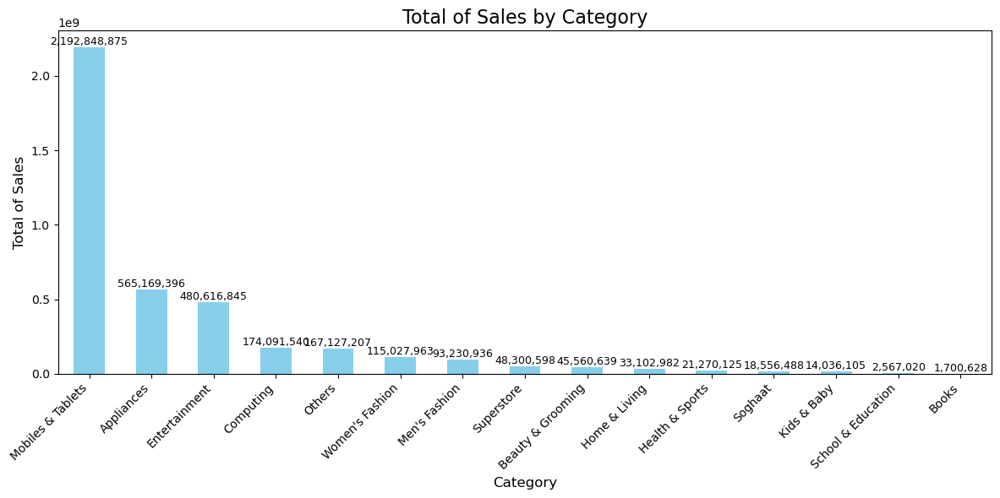

In [55]:
sales_by_category = df.groupby('category_name_1')['grand_total'].sum().sort_values(ascending=False)
plt.figure(figsize=(12, 6))  
sales_by_category.plot(kind='bar', color='skyblue') 
for i, value in enumerate(sales_by_category):
    plt.text(i, value, f'{value:,.0f}', ha='center', va='bottom', fontsize=9)
plt.title('Total of Sales by Category', fontsize=16)
plt.xlabel('Category', fontsize=12)
plt.ylabel('Total of Sales', fontsize=12)
plt.xticks(rotation=45, ha='right')  
plt.tight_layout()
plt.show()

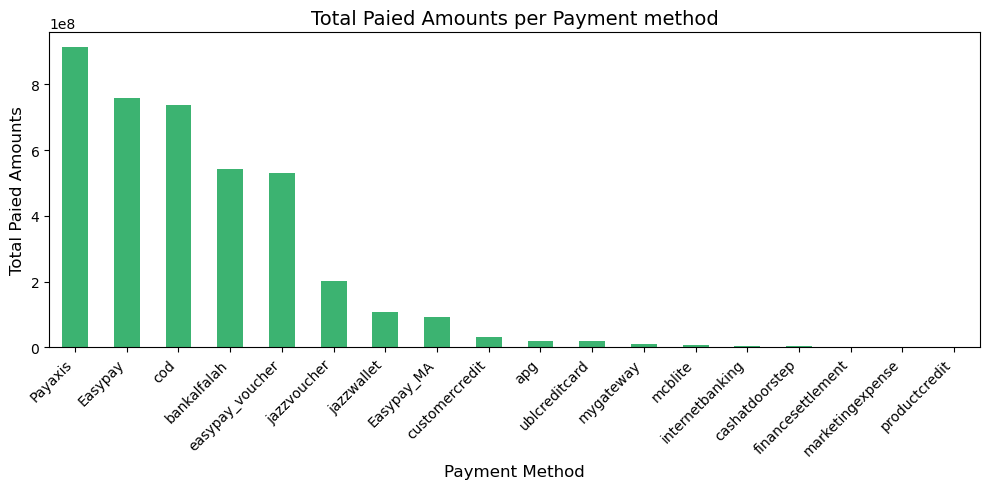

In [56]:
payment_totals = df.groupby('payment_method')['grand_total'].sum().sort_values(ascending=False)
plt.figure(figsize=(10, 5))
payment_totals.plot(kind='bar', color='mediumseagreen')
plt.title('Total Paied Amounts per Payment method', fontsize=14)
plt.xlabel('Payment Method', fontsize=12)
plt.ylabel('Total Paied Amounts', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

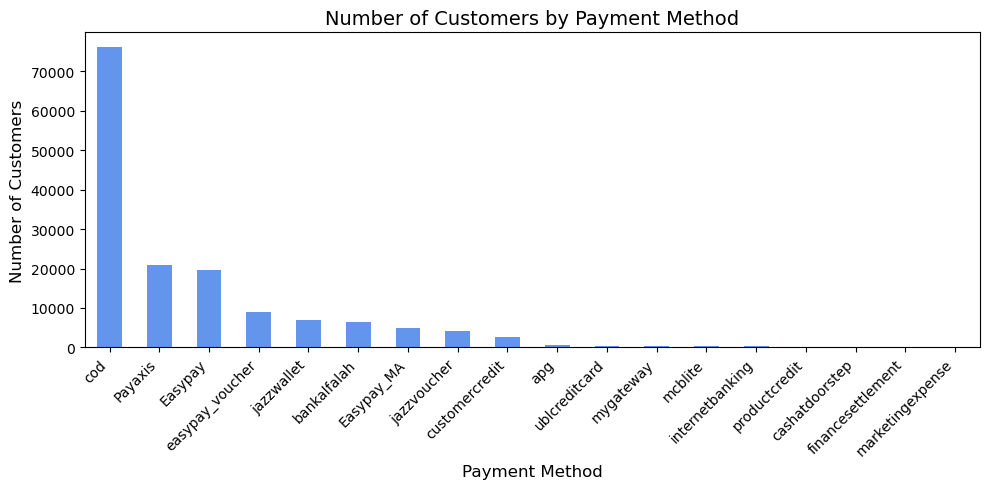

In [57]:
customer_counts = df.groupby('payment_method')['Customer ID'].nunique().sort_values(ascending=False)
plt.figure(figsize=(10, 5))
customer_counts.plot(kind='bar', color='cornflowerblue')
plt.title('Number of Customers by Payment Method', fontsize=14)
plt.xlabel('Payment Method', fontsize=12)
plt.ylabel('Number of Customers', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

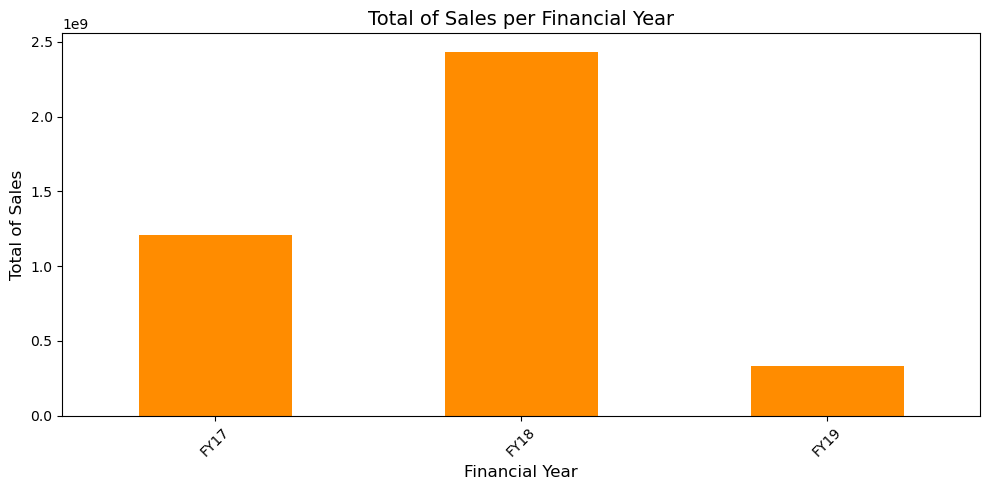

In [58]:
sales_by_fy = df.groupby('FY')['grand_total'].sum().sort_index()
plt.figure(figsize=(10, 5))
sales_by_fy.plot(kind='bar', color='darkorange')
plt.title('Total of Sales per Financial Year', fontsize=14)
plt.xlabel('Financial Year', fontsize=12)
plt.ylabel('Total of Sales', fontsize=12)
plt.xticks(rotation=45, ha='center')
plt.tight_layout()
plt.show()

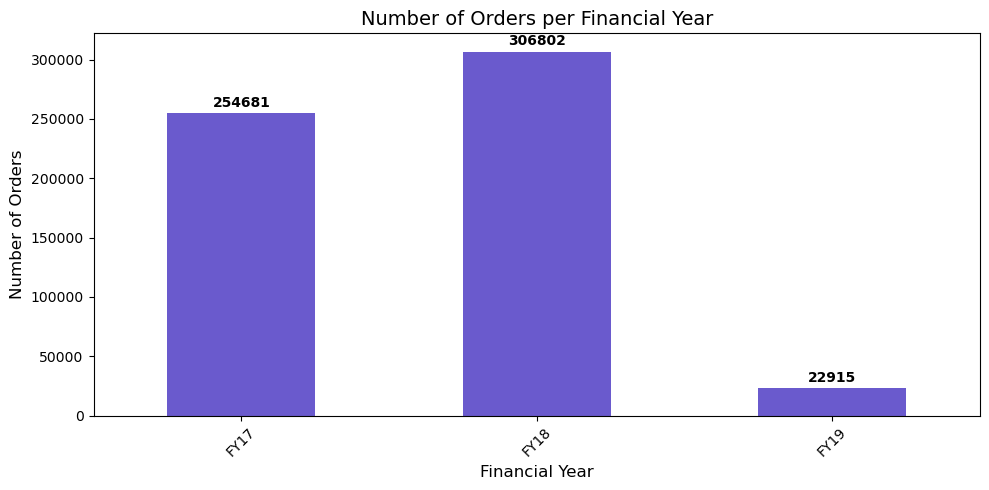

In [59]:
orders_per_fy = df.groupby('FY')['item_id'].nunique().sort_index()
plt.figure(figsize=(10, 5))
orders_per_fy.plot(kind='bar', color='slateblue')
plt.title('Number of Orders per Financial Year', fontsize=14)
plt.xlabel('Financial Year', fontsize=12)
plt.ylabel('Number of Orders', fontsize=12)
plt.xticks(rotation=45, ha='center')
plt.tight_layout()
for i, value in enumerate(orders_per_fy):
    plt.text(i, value + max(orders_per_fy)*0.01, str(value), 
             ha='center', va='bottom', fontsize=10, fontweight='bold')
plt.show()

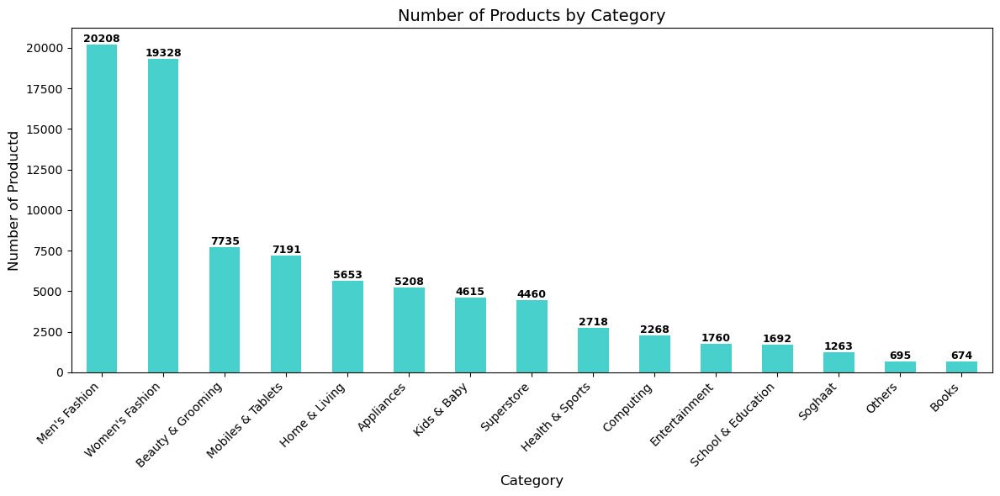

In [60]:
sku_per_category = df.groupby('category_name_1')['sku'].nunique().sort_values(ascending=False)
plt.figure(figsize=(12, 6))
bars = sku_per_category.plot(kind='bar', color='mediumturquoise')
plt.title('Number of Products by Category', fontsize=14)
plt.xlabel('Category', fontsize=12)
plt.ylabel('Number of Productd', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
for i, value in enumerate(sku_per_category):
    plt.text(i, value + 0.5, str(value), ha='center', va='bottom', fontsize=9, fontweight='bold')
plt.show()